In [2]:
from arty.core.color import visualize_color_set
from arty.sbr.preset import Preset, PresetAdv
from arty.sbr.image_painter import ImagePainter, IrregularBrushImagePainter
from arty import core, filter
from matplotlib import pyplot as plt
import cv2

plt.rcParams["figure.figsize"] = (20, 20)

In [3]:
def showInRow(list_of_images, titles=None, disable_ticks=False):
    count = len(list_of_images)
    for idx in range(count):
        subplot = plt.subplot(1, count, idx + 1)
        if titles is not None:
            subplot.set_title(titles[idx])

        img = list_of_images[idx]
        cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
        subplot.imshow(img, cmap=cmap)
        if disable_ticks:
            plt.xticks([]), plt.yticks([])
    plt.show()

# Single-point stroke algorithm
## Multi-layer

In [4]:
preset = Preset(
                stroke_scale=1,
                layer_scales = [8, 4, 2],
                gradient_smoothing_radius=15,
                length_scale=1/5,
                brush_type="ellipse",
                gradient_type="sharr",
                gradient_smoothing_type="gaussian",
                smoothing_iterations=1,
                length_type="base",
                length_first_flag=True,
                grid_scale=3,
                grayscale=False,
                has_cardboard=False,
                palette_size=45,
)

sharr
Painting image with multiple layers...
Computing color set...
Extending color color set...
Computing gradient...
sharr gaussian 15 1
Painting layer 1 with stroke scale 8...


100%|██████████| 2/2 [00:00<00:00, 10.99it/s]


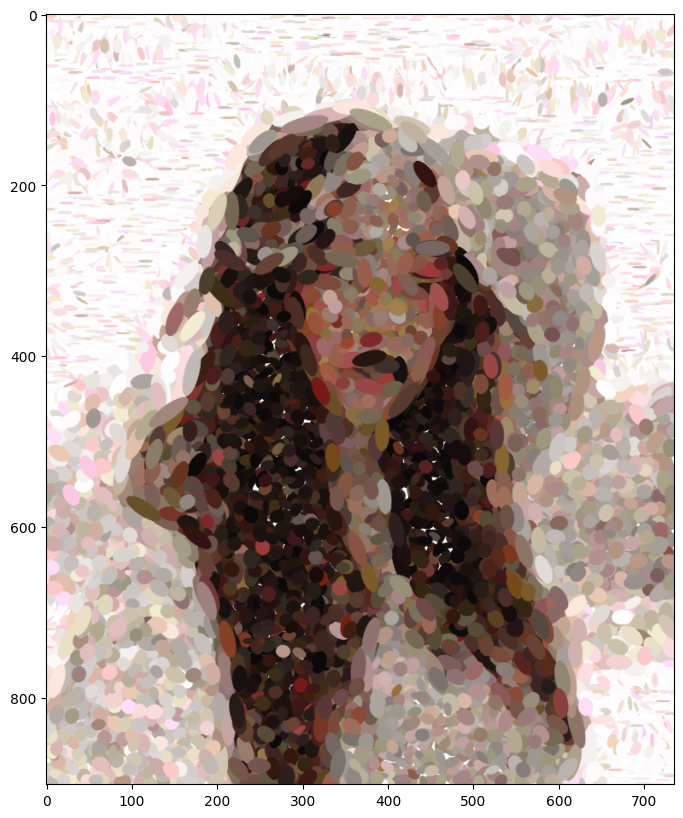

Painting layer 2 with stroke scale 4...


100%|██████████| 5/5 [00:00<00:00,  9.59it/s]


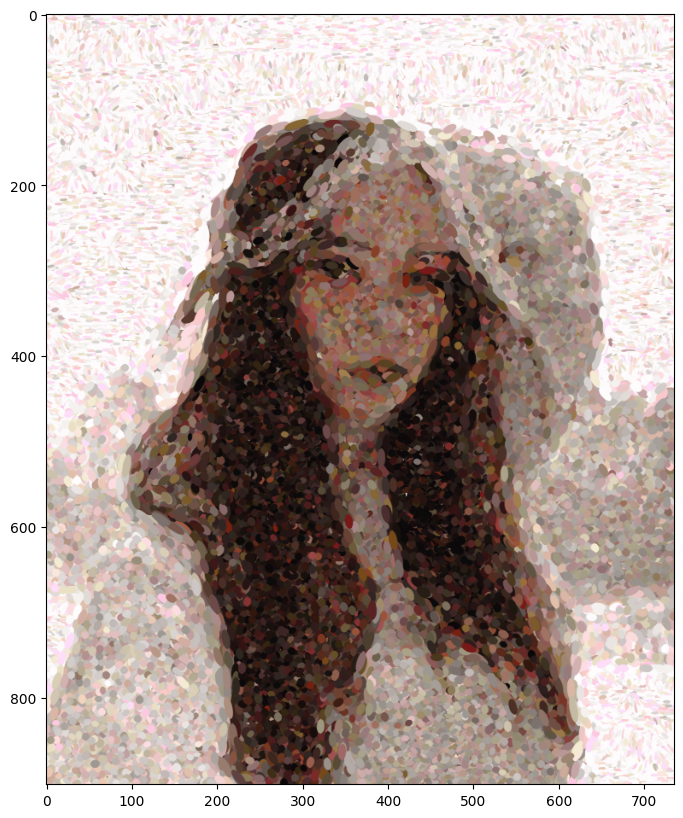

Painting layer 3 with stroke scale 2...


100%|██████████| 17/17 [00:02<00:00,  8.11it/s]


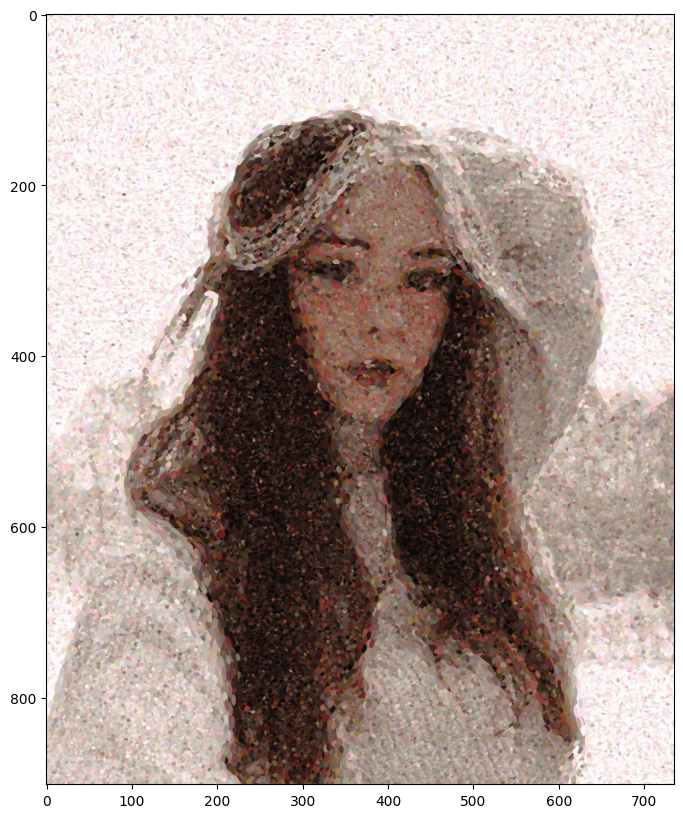

In [5]:
img = cv2.imread("images/img.png")

painter = ImagePainter(img, preset)
print(painter.preset.gradient_type)
result = painter.paint()

## The same, but with one layer

sharr
Painting image with multiple layers...
Computing color set...
Extending color color set...
Computing gradient...
sharr gaussian 15 1
Painting layer 1 with stroke scale 2...


100%|██████████| 17/17 [00:01<00:00,  9.02it/s]


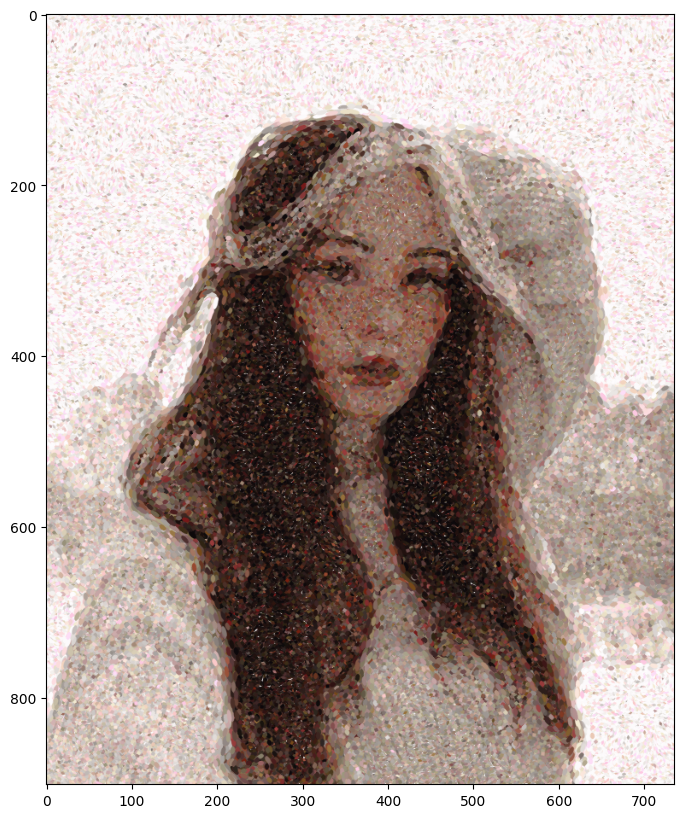

In [6]:
# preset1 = preset.copy()
preset.layer_scales = [2] 
painter1 = ImagePainter(img, preset)
print(painter1.preset.gradient_type)
result1 = painter1.paint()

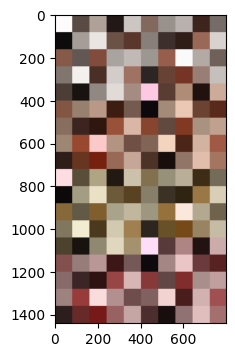

array([[[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [103, 107, 117],
        [103, 107, 117],
        [103, 107, 117]],

       [[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [103, 107, 117],
        [103, 107, 117],
        [103, 107, 117]],

       [[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [103, 107, 117],
        [103, 107, 117],
        [103, 107, 117]],

       ...,

       [[ 30,  30,  45],
        [ 30,  30,  45],
        [ 30,  30,  45],
        ...,
        [111, 111, 164],
        [111, 111, 164],
        [111, 111, 164]],

       [[ 30,  30,  45],
        [ 30,  30,  45],
        [ 30,  30,  45],
        ...,
        [111, 111, 164],
        [111, 111, 164],
        [111, 111, 164]],

       [[ 30,  30,  45],
        [ 30,  30,  45],
        [ 30,  30,  45],
        ...,
        [111, 111, 164],
        [111, 111, 164],
        [111, 111, 164]]

In [7]:
visualize_color_set(painter1.color_set)

In [8]:
preset = Preset(
                stroke_scale=5,
                gradient_smoothing_radius=15,
                length_scale=1/4,
                brush_type="ellipse",
                gradient_type="sharr",
                gradient_smoothing_type="none",
                smoothing_iterations=1,
                length_type="base",
                length_first_flag=True,
                grid_scale=3,
                grayscale=False,
                has_cardboard=False,
                palette_size=45,
)
        

preset_adv = PresetAdv(brush_sizes = [16, 8, 4])

Smoothing:  none
sharr
Computing gradient...
sharr none 15 1
Painting with multiple layers...
Computing gradient...
luminance
sharr none 15 1
Painting layer 1 with brush size 16...


100%|██████████| 350/350 [00:00<00:00, 868.48it/s]


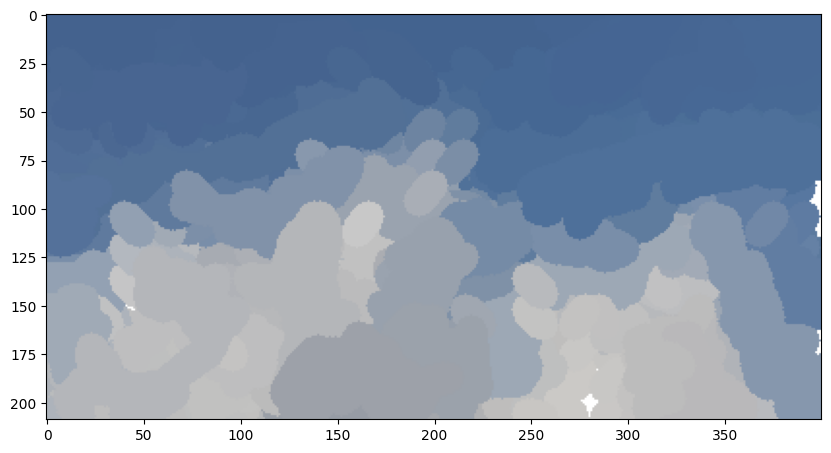

Painting layer 2 with brush size 8...


100%|██████████| 1350/1350 [00:02<00:00, 527.92it/s]


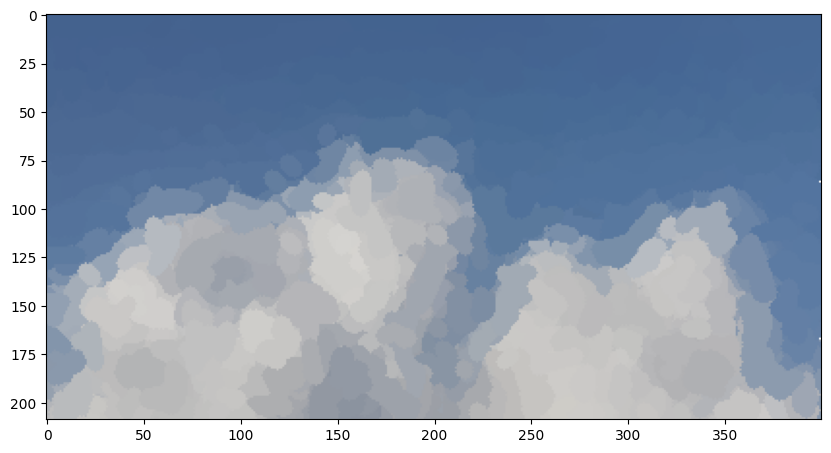

Painting layer 3 with brush size 4...


100%|██████████| 5300/5300 [00:11<00:00, 478.48it/s]


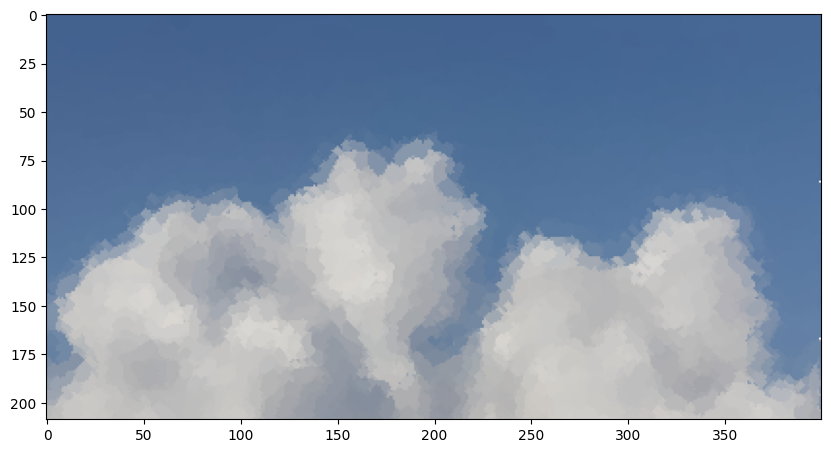

In [9]:
image = cv2.imread("../_demo/images/img_6.png")
# mask = cv2.imread("../_demo/images/mask1.png", cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (image.shape[1]//3, image.shape[0]//3))
painter = IrregularBrushImagePainter(image, preset, preset_adv)
print(painter.preset.gradient_type)
painter.compute_gradient()
result2 = painter.paint()

##  VIsualization of color set

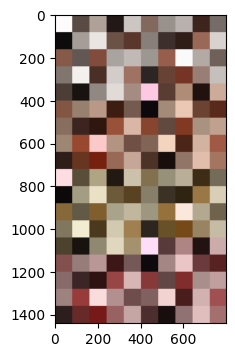

array([[[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [103, 107, 117],
        [103, 107, 117],
        [103, 107, 117]],

       [[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [103, 107, 117],
        [103, 107, 117],
        [103, 107, 117]],

       [[252, 251, 253],
        [252, 251, 253],
        [252, 251, 253],
        ...,
        [103, 107, 117],
        [103, 107, 117],
        [103, 107, 117]],

       ...,

       [[ 30,  30,  45],
        [ 30,  30,  45],
        [ 30,  30,  45],
        ...,
        [111, 111, 164],
        [111, 111, 164],
        [111, 111, 164]],

       [[ 30,  30,  45],
        [ 30,  30,  45],
        [ 30,  30,  45],
        ...,
        [111, 111, 164],
        [111, 111, 164],
        [111, 111, 164]],

       [[ 30,  30,  45],
        [ 30,  30,  45],
        [ 30,  30,  45],
        ...,
        [111, 111, 164],
        [111, 111, 164],
        [111, 111, 164]]

In [10]:
visualize_color_set(painter1.color_set)

# Irregular brush algorithm

In [11]:
preset = Preset(
                stroke_scale=5,
                gradient_smoothing_radius=15,
                length_scale=1/4,
                brush_type="ellipse",
                gradient_type="sharr",
                gradient_smoothing_type="none",
                smoothing_iterations=1,
                length_type="base",
                length_first_flag=True,
                grid_scale=3,
                grayscale=False,
                has_cardboard=False,
                palette_size=45,
)
        

preset_adv = PresetAdv(brush_sizes = [16, 8, 4])

Smoothing:  none
sharr
Computing gradient...
sharr none 15 1
Painting with multiple layers...
Computing gradient...
luminance
sharr none 15 1
Painting layer 1 with brush size 16...


100%|██████████| 350/350 [00:00<00:00, 874.43it/s]


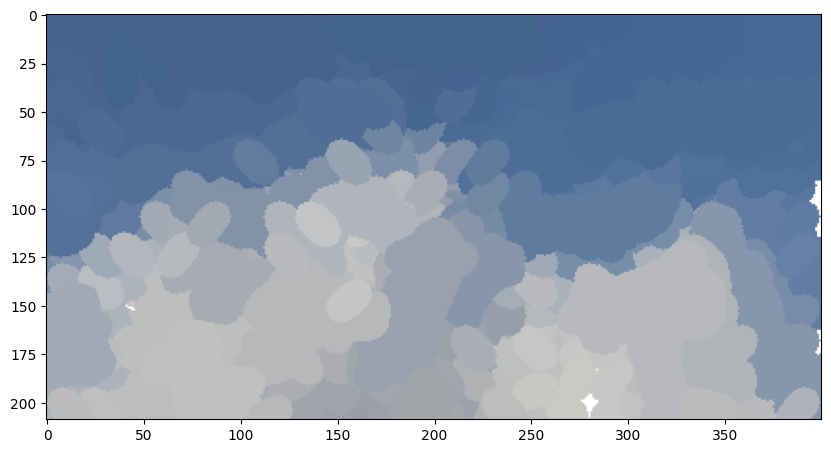

Painting layer 2 with brush size 8...


100%|██████████| 1350/1350 [00:02<00:00, 511.49it/s]


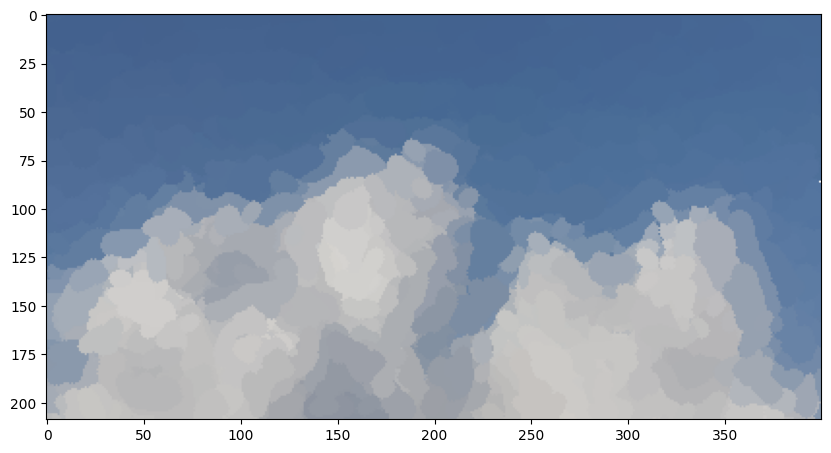

Painting layer 3 with brush size 4...


100%|██████████| 5300/5300 [00:11<00:00, 473.97it/s]


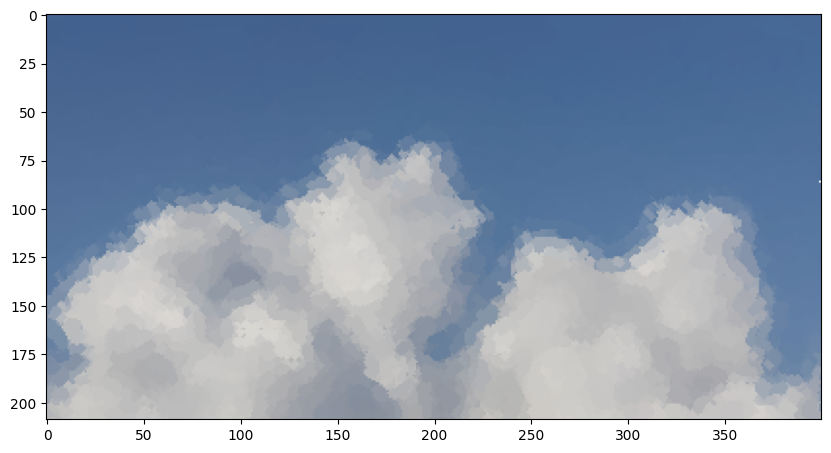

In [12]:
image = cv2.imread("../_demo/images/img_6.png")
# mask = cv2.imread("../_demo/images/mask1.png", cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (image.shape[1]//3, image.shape[0]//3))
painter = IrregularBrushImagePainter(image, preset, preset_adv)
print(painter.preset.gradient_type)
painter.compute_gradient()
result2 = painter.paint()

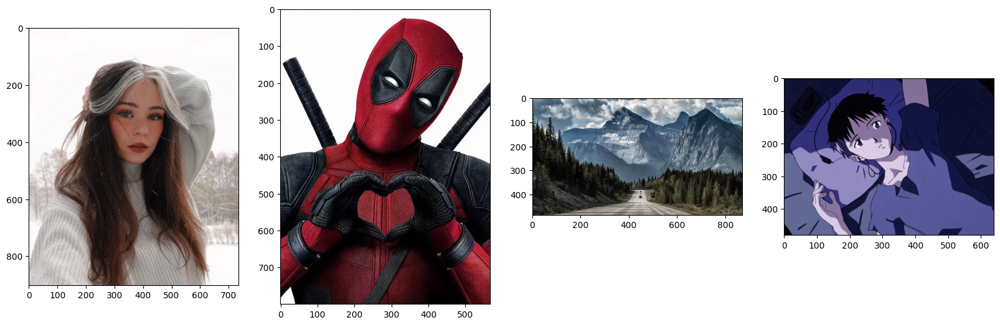

In [13]:
girl = cv2.cvtColor(cv2.imread(f'images/img.png'), cv2.COLOR_BGR2RGB)
deadpool = cv2.cvtColor(cv2.imread(f'images/deadpool.png'), cv2.COLOR_BGR2RGB)
mountain = cv2.cvtColor(cv2.imread(f'images/img_4.png'), cv2.COLOR_BGR2RGB)
anime = cv2.cvtColor(cv2.imread(f'images/img_12.png'), cv2.COLOR_BGR2RGB)
showInRow([girl, deadpool, mountain, anime])

# Point images

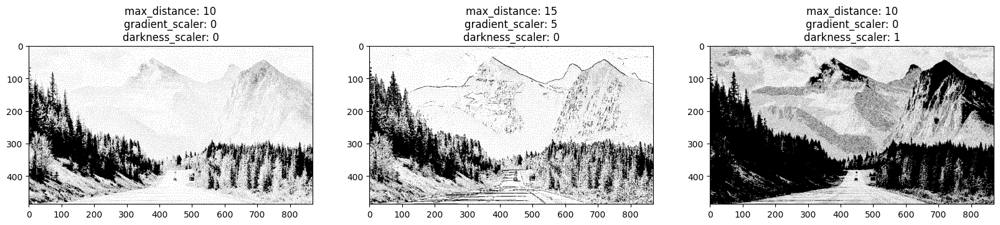

In [14]:
points = []
titles = []
for max_distance, gradient_scaler, darkness_scaler in ((10, 0, 0), (15, 5, 0), (10, 0, 1)):
    point_filter = filter.Points(max_distance, gradient_scaler, darkness_scaler)
    points.append(point_filter.process(mountain))
    titles.append(
        f'max_distance: {max_distance}\ngradient_scaler: {gradient_scaler}\ndarkness_scaler: {darkness_scaler}')
showInRow(points, titles)

# Stroke images

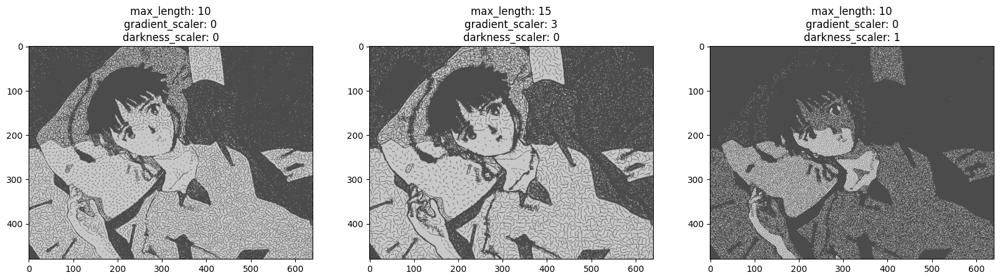

In [15]:
strokes = []
titles = []
for max_distance, gradient_scaler, darkness_scaler in ((10, 0, 0), (15, 3, 0), (10, 0, 1)):
    point_filter = filter.Points(max_distance, gradient_scaler, darkness_scaler)
    strokes_filter = filter.Strokes(max_distance)
    strokes.append(strokes_filter.process(anime, points=point_filter.process(anime)))
    titles.append(
        f'max_length: {max_distance}\ngradient_scaler: {gradient_scaler}\ndarkness_scaler: {darkness_scaler}')
showInRow(strokes, titles)

# Line images

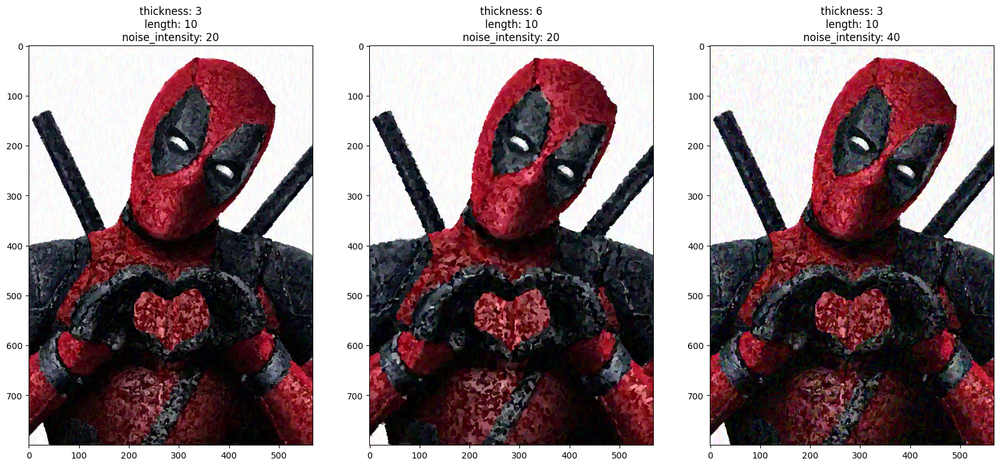

In [16]:
lines = []
titles = []
for thickness, length, noise_intensity in ((3, 10, 20), (6, 10, 20), (3, 10, 40)):
    lines_filter = filter.Lines(thickness, length, noise_intensity)
    lines.append(lines_filter.process(deadpool))
    titles.append(
        f'thickness: {thickness}\nlength: {length}\nnoise_intensity: {noise_intensity}')
showInRow(lines, titles)

# Pencil images

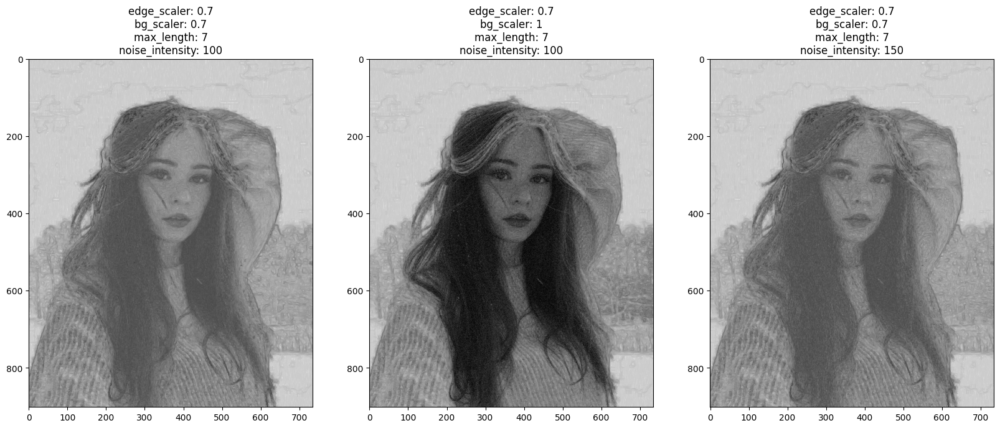

In [17]:
pencil = []
titles = []
for edge_scaler, bg_scaler, max_length, noise_intensity in (((0.7, 0.7, 7, 100),(0.7, 1, 7, 100), (0.7, 0.7, 7, 150))):
    pencil_filter = filter.Pencil(edge_scaler, bg_scaler, max_length, noise_intensity)
    pencil.append(pencil_filter.process(girl))
    titles.append(
        f'edge_scaler: {edge_scaler}\nbg_scaler: {bg_scaler}\nmax_length: {max_length}\nnoise_intensity: {noise_intensity}')
showInRow(pencil, titles)

## Add some conditional angles

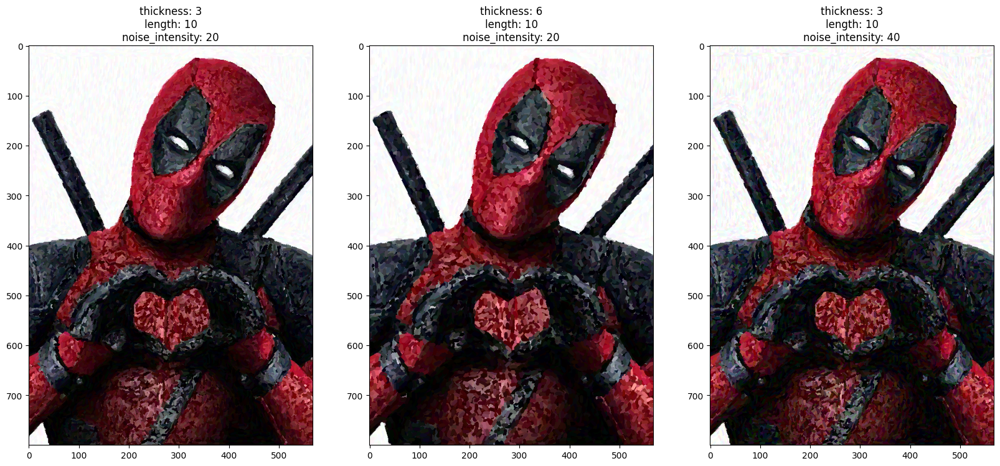

In [18]:
lines = []
titles = []
angle = core.angle.Conditional()
for thickness, length, noise_intensity in ((3, 10, 20), (6, 10, 20), (3, 10, 40)):
    lines_filter = filter.Lines(thickness, length, noise_intensity)
    lines.append(lines_filter.process(deadpool, angles=angle.predict(deadpool)))
    titles.append(
        f'thickness: {thickness}\nlength: {length}\nnoise_intensity: {noise_intensity}')
showInRow(lines, titles)

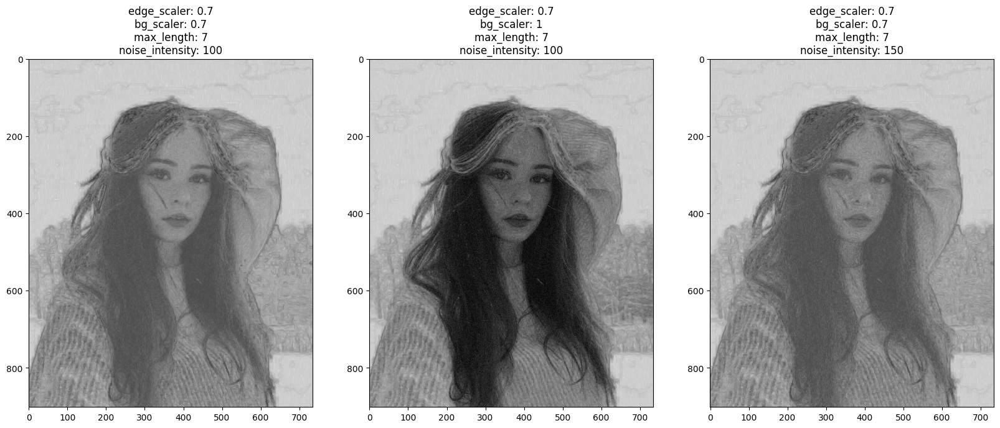

In [19]:
pencil = []
titles = []
angle = core.angle.Conditional()
for edge_scaler, bg_scaler, max_length, noise_intensity in (((0.7, 0.7, 7, 100),(0.7, 1, 7, 100), (0.7, 0.7, 7, 150))):
    pencil_filter = filter.Pencil(edge_scaler, bg_scaler, max_length, noise_intensity)
    pencil.append(pencil_filter.process(girl, angles=angle.predict(girl)))
    titles.append(
        f'edge_scaler: {edge_scaler}\nbg_scaler: {bg_scaler}\nmax_length: {max_length}\nnoise_intensity: {noise_intensity}')
showInRow(pencil, titles)